In [3]:
import os
import matplotlib.pyplot as plt
import numpy as np
import argparse
import torch
import random
from PIL import Image
from huggingface_hub import snapshot_download
from diffusers import StableDiffusionInstructPix2PixPipeline, UNet2DConditionModel

cache_dir = '../../data/huggingface_cache/' # or change to your own cache 
os.makedirs(cache_dir, exist_ok=True)

def show_PIL(imgs, name, wspace=0, save_path=None):
    if not isinstance(imgs, list):
        imgs = [imgs]
    size = 10  # 4
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(len(imgs) * size, size))
    for i, img in enumerate(imgs):
        # img = img.detach()
        # img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.subplots_adjust(wspace=wspace, hspace=0)
    plt.axis('off')

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1, dpi=300)
        print(f"Saved image to: {save_path}")
    plt.show()


## Download Pretrained Model

In [ ]:
snapshot_download(
    repo_id="didsr/ssynth_data",
    repo_type="dataset",
    allow_patterns="data/pretrained_models/diffusion/finetune_instructpix2pix_hair_smart/*",
    local_dir='../../',           # default or use something else
    local_dir_use_symlinks=False
)

## Evaluate Hair Model

Load pretrained model:

In [6]:
def load_model():
    model_path = "../../data/pretrained_models/diffusion/finetune_instructpix2pix_hair_smart/checkpoint-15000/"

    unet = UNet2DConditionModel.from_pretrained(model_path + "/unet")

    pipe_finetuned = StableDiffusionInstructPix2PixPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        cache_dir=cache_dir,
        local_files_only=False, # change to true if no internet access and already have files
        unet=unet,
        safety_checker=None,
        requires_safety_checker=False)
    pipe_finetuned = pipe_finetuned.to("cuda")
    pipe_finetuned.set_progress_bar_config(disable=True)
    generator_finetuned = torch.Generator("cuda").manual_seed(0)

    return pipe_finetuned, generator_finetuned

In [ ]:
pipe, generator = load_model()

Run evaluation:

In [8]:
ham_path = '../../data/real_dataset/HAM10k/'
l_images = ['HAM10000_images_part_1/ISIC_0027419.jpg', 
            'HAM10000_images_part_1/ISIC_0029068.jpg', 
            'HAM10000_images_part_1/ISIC_0025837.jpg', 
            'HAM10000_images_part_1/ISIC_0028534.jpg']

l_img_paths = [ham_path + name for name in l_images] 

In [9]:
l_prompts_hair_prop = ['Add thick brown hair artifact', 'Add thin brown hair artifact', 'Add thick grey hair artifact']

['Add thick brown hair artifact', 'Add thin brown hair artifact', 'Add thick grey hair artifact']


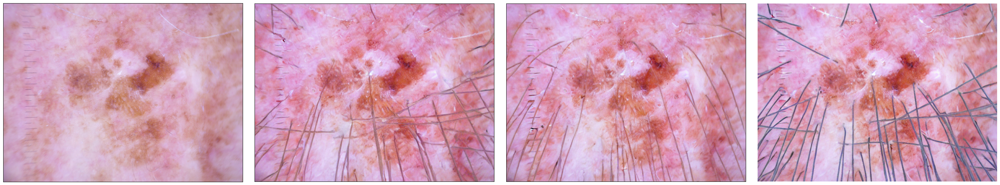

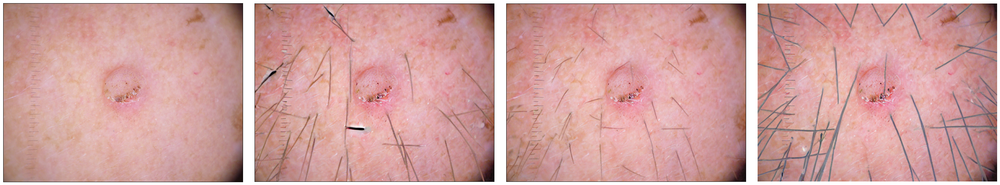

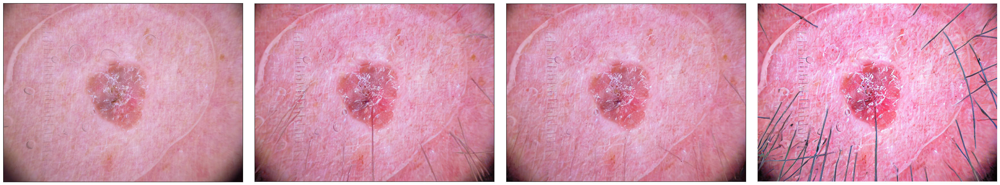

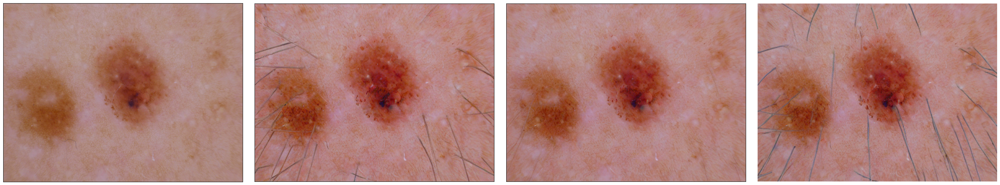

In [10]:
num_inference_steps = 50
image_guidance_scale = 1.5
guidance_scale = 10

print(l_prompts_hair_prop)

for img_name in l_img_paths:
    image_original = Image.open(img_name).convert('RGB')

    l_edited_img = []
    for prompt in l_prompts_hair_prop:
        edited_image_finetuned = pipe(prompt,
                                                image=image_original,
                                                num_inference_steps=num_inference_steps,
                                                image_guidance_scale=image_guidance_scale,
                                                guidance_scale=guidance_scale,
                                                generator=generator,
                                                ).images[0]
        l_edited_img.append(edited_image_finetuned)
    
    show_PIL([image_original] + l_edited_img, name='', wspace=0.05)
